In [8]:
import tensorflow as tf
import sys

sys.path.append('../')

from src.Objective import Objective
from src.Parameterization import Parameterization
from src.Transformation import *
from src.Regularizer import *
from src.Optimizer import *
from src.Miscellaneous import load_files, plot_all
from src.Attribution import *
from src.Wrapper import *

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Model selection

In [9]:
# Model names: https://keras.io/api/applications/

model = Wrapper(model = 'InceptionV3')

print(model.layers())

['input_2', 'conv2d_94', 'batch_normalization_94', 'activation_94', 'conv2d_95', 'batch_normalization_95', 'activation_95', 'conv2d_96', 'batch_normalization_96', 'activation_96', 'max_pooling2d_4', 'conv2d_97', 'batch_normalization_97', 'activation_97', 'conv2d_98', 'batch_normalization_98', 'activation_98', 'max_pooling2d_5', 'conv2d_102', 'batch_normalization_102', 'activation_102', 'conv2d_100', 'conv2d_103', 'batch_normalization_100', 'batch_normalization_103', 'activation_100', 'activation_103', 'average_pooling2d_9', 'conv2d_99', 'conv2d_101', 'conv2d_104', 'conv2d_105', 'batch_normalization_99', 'batch_normalization_101', 'batch_normalization_104', 'batch_normalization_105', 'activation_99', 'activation_101', 'activation_104', 'activation_105', 'mixed0', 'conv2d_109', 'batch_normalization_109', 'activation_109', 'conv2d_107', 'conv2d_110', 'batch_normalization_107', 'batch_normalization_110', 'activation_107', 'activation_110', 'average_pooling2d_10', 'conv2d_106', 'conv2d_108'

# Neuron

In [10]:
# Layer name which the neuron comes from
layer = 'mixed5'


# Neuron coordinates (x, y, channel)
print(model.get_layer(layer = layer).output.shape)

x = 6
y = 3
channel = 32

(None, 17, 17, 768)


### Objective

In [4]:
objective = Objective.neuron(model = model, 
                             layer = layer,
                             x = x,
                             y = y,
                             channels = channel) # channels can be a list


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

### Activation maximization

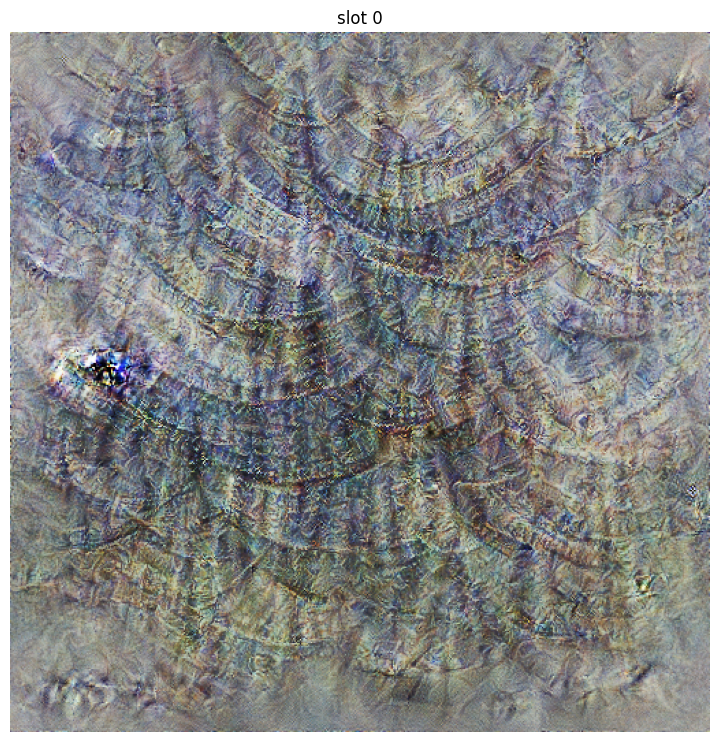

In [6]:
images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False)

plot_all(images)

# Channel

In [6]:
# Layer name which the channel comes from
layer = 'mixed5'

# Channel index
print(model.get_layer(layer = layer).output.shape)

channel = 32

(None, 17, 17, 768)


### Objective

In [7]:
objective = Objective.channel(model = model, 
                              layer = layer,
                              channels = channel) # channels can be a list


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

### Activation maximization

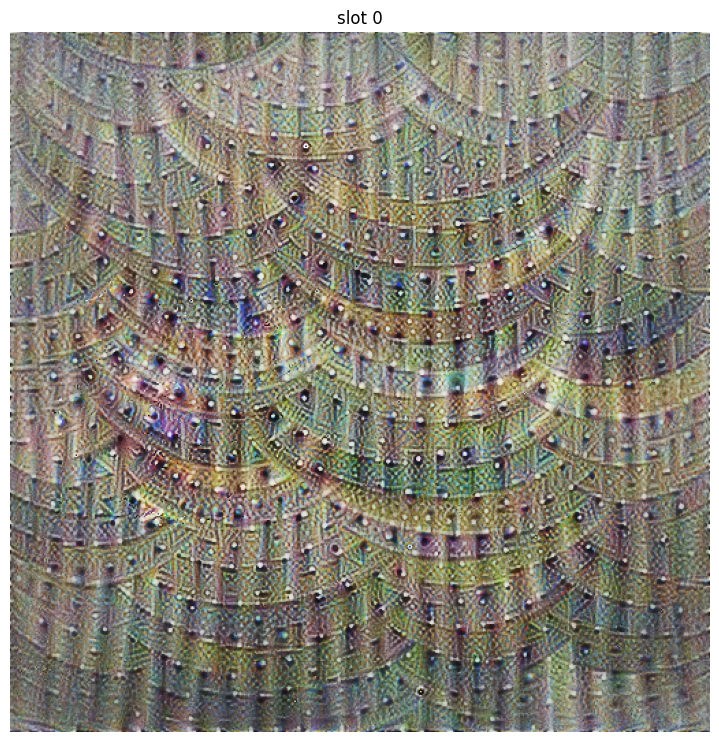

In [8]:
images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False)

plot_all(images)

# Spatial

In [3]:
# Layer name
layer = 'mixed5'

spatial = 32

### Objective

In [4]:
objective = Objective.spatial(model = model, 
                              layer = layer,
                              spatials = spatial)


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

### Activation maximization

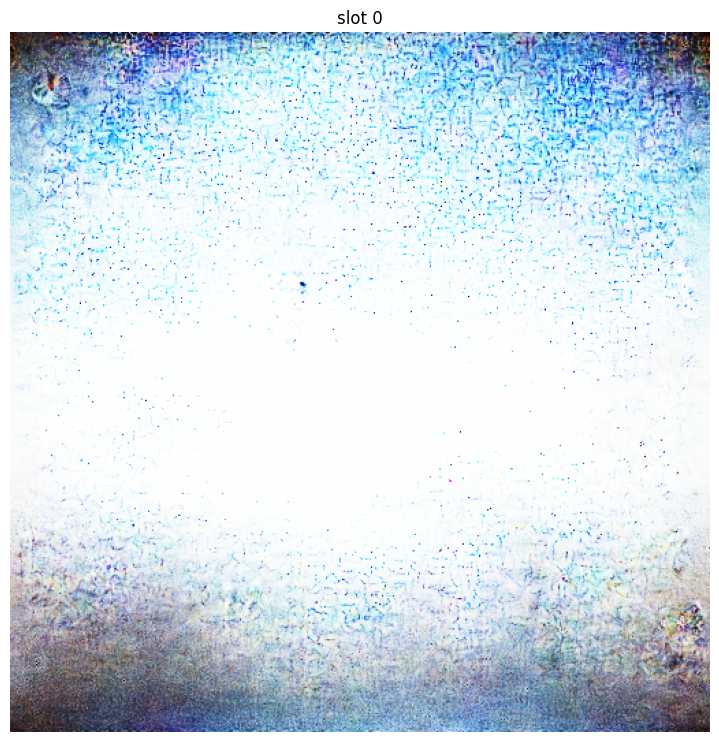

In [5]:
images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, learning_rate = 0.1)

plot_all(images)

# Layer

In [9]:
# Layer name
layer = 'mixed5'

### Objective

In [10]:
objective = Objective.layer(model = model, 
                            layer = layer)


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

### Activation maximization

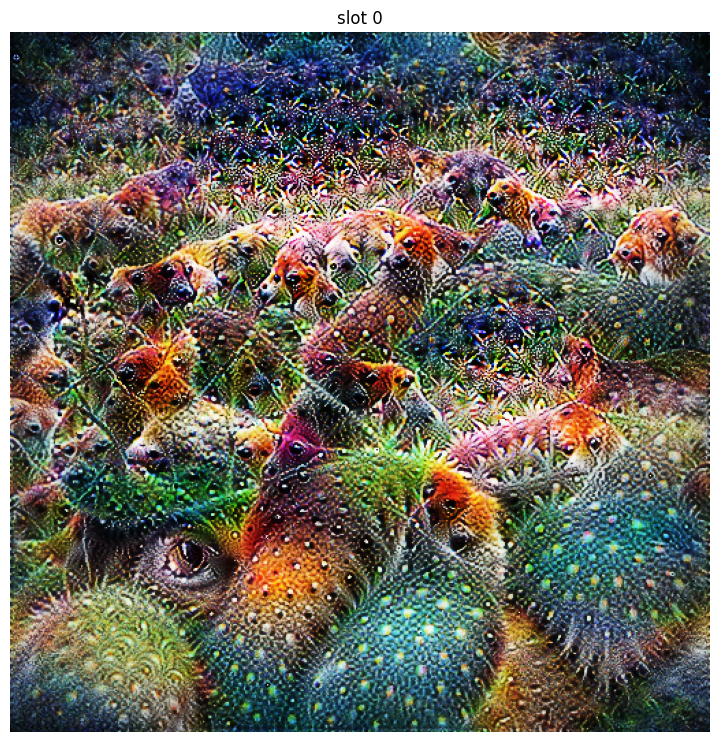

In [11]:
images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, learning_rate = 0.1)

plot_all(images)

### Objective squared

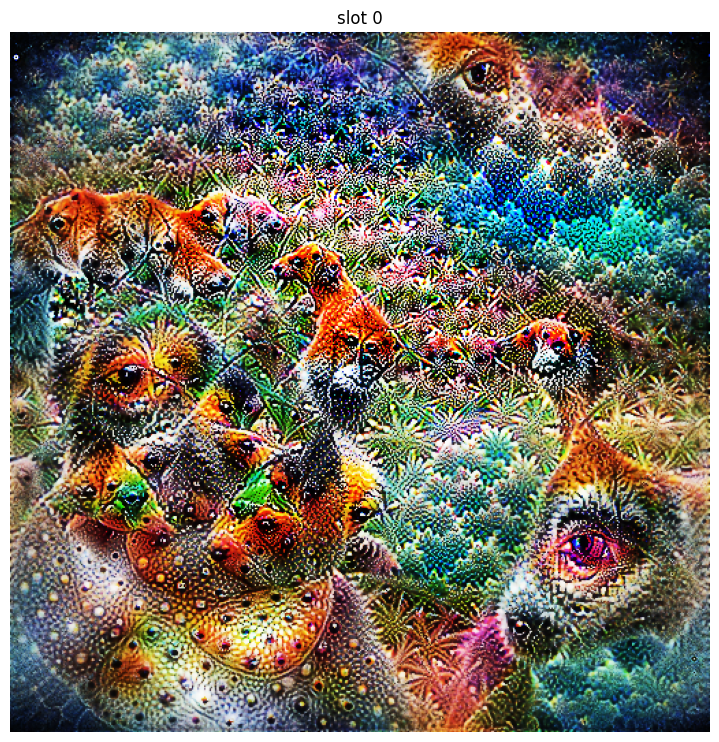

In [12]:
objective = Objective.layer(model = model, 
                            layer = layer,
                            squared = True) # means that the layer activations will be squared


images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, learning_rate = 0.1)

plot_all(images)

# Image resolution

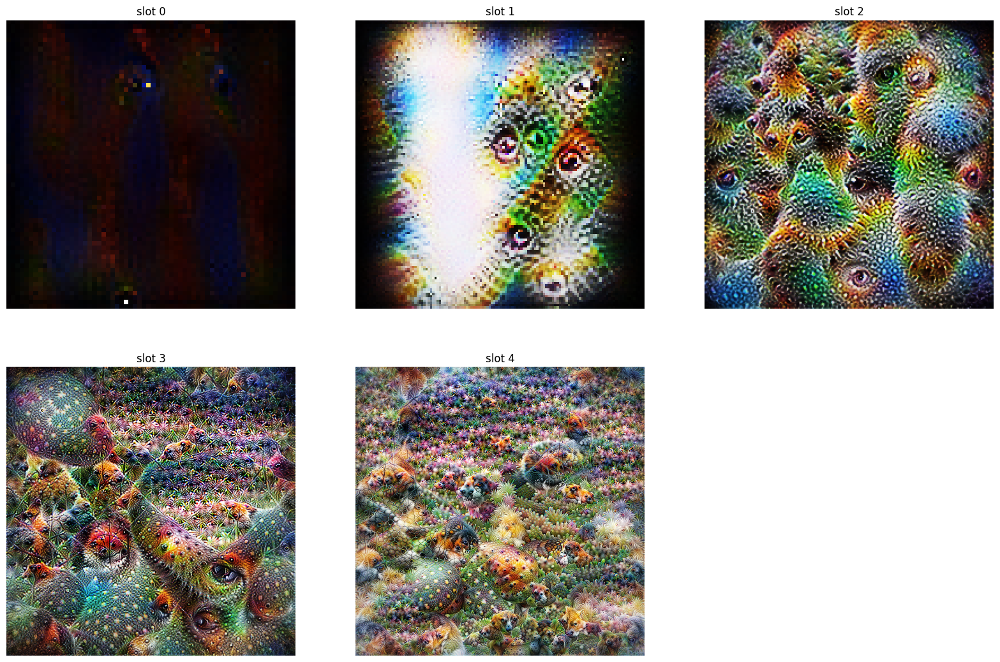

In [13]:
# Layer name
layer = 'mixed5'

objective = Objective.layer(model = model, 
                            layer = layer)

sizes = [64, 128, 256, 512, 1024]
    
images = []

for size in sizes:
    # Check parameterization tutorial for more details
    parameterization = Parameterization.image_fft(size)
    
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = 0.1,
                      image_shape = (size, size),
                      verbose = False)[0])

plot_all(images)

# Learning Rate

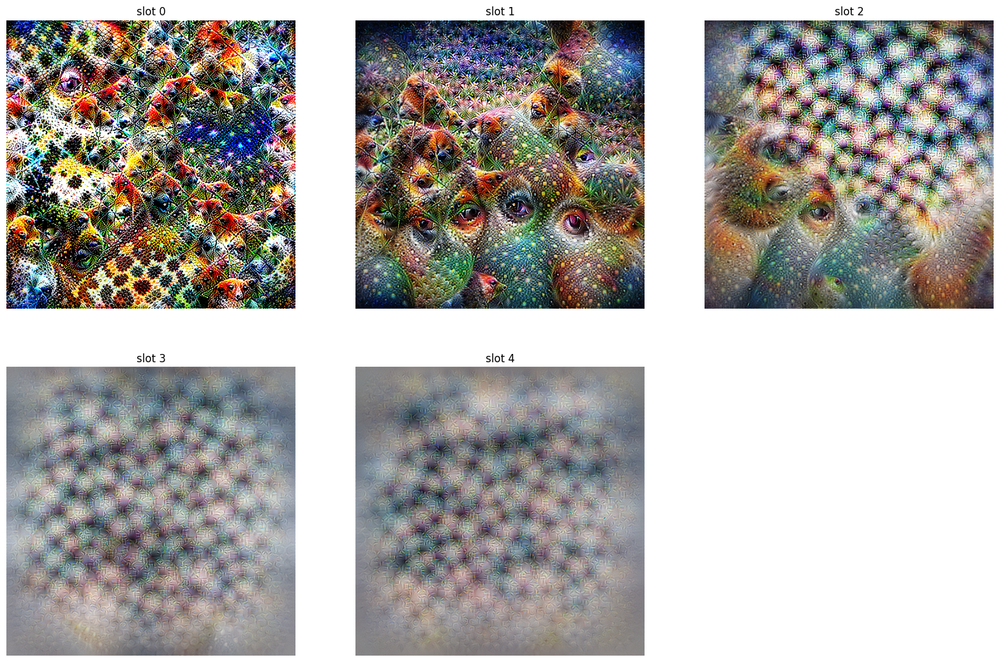

In [14]:
# Layer name
layer = 'mixed5'

objective = Objective.layer(model = model, 
                            layer = layer)


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

rates = [0.5, 0.1, 0.05, 0.01, 0.005]
    
images = []

for rate in rates:
    images.append(run(objective, parameterization, 
                      steps = 1000, learning_rate = rate,
                      verbose = False)[0])

plot_all(images)

# Progress at each step

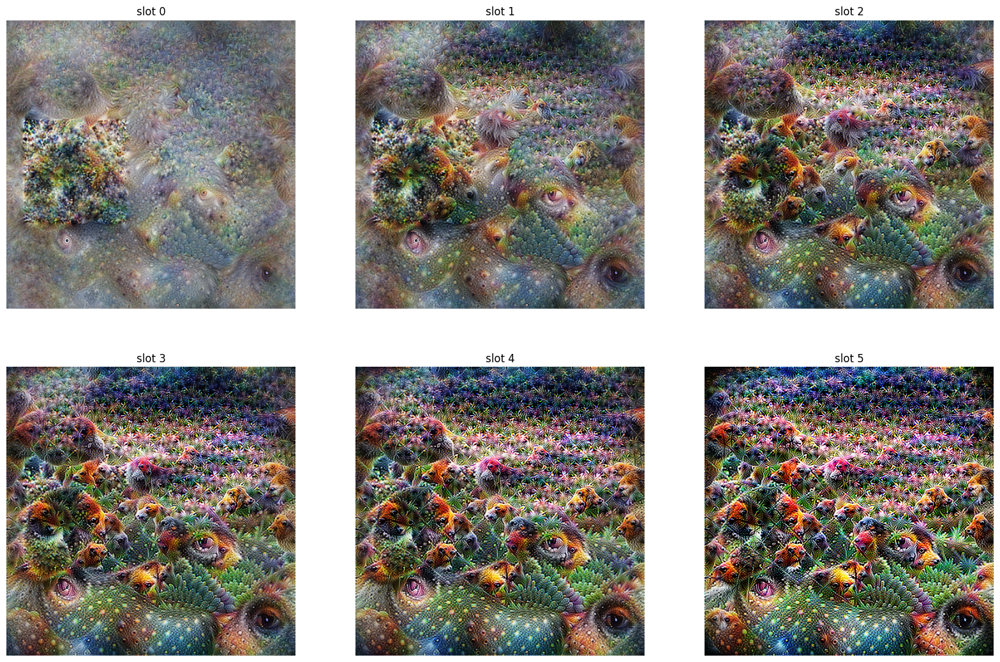

In [6]:
# Layer name
layer = 'mixed5'

objective = Objective.layer(model = model, 
                            layer = layer)


# Check parameterization tutorial for more details
parameterization = Parameterization.image_fft(512)

images = run(objective, parameterization, 
             steps = 2000, learning_rate = 0.1,
             save_step = [100, 250, 500, 750, 1000, 2000],
             verbose = False)

plot_all(images)